In [6]:
# pip install sklearn

In [7]:
# pip install -U numpy

In [8]:
import pandas as pd
import numpy as np
import sympy as sp
from sklearn.linear_model import LinearRegression
import seaborn as sns
# from sklearn import linear_model
import matplotlib.pyplot as plt
house = pd.read_csv('housing_price.csv')
house.head()

,inverse age of flat (year-1),inverse distance to the nearest MRT station (km-1),price per square metre ($ in thousands)
0,0.160,7.404,8.913
1,0.114,1.789,6.308
2,0.049,1.379,5.963
3,0.046,1.373,5.511
4,0.183,15.948,9.774


In [9]:
house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30 entries, 0 to 29
Data columns (total 3 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   inverse age of flat (year-1)                        30 non-null     float64
 1   inverse distance to the nearest MRT station (km-1)  30 non-null     float64
 2   price per square metre ($ in thousands)             30 non-null     float64
dtypes: float64(3)
memory usage: 848.0 bytes


<AxesSubplot:>

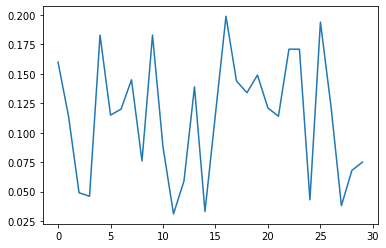

In [10]:
house['inverse age of flat (year-1)'].plot()

<AxesSubplot:>

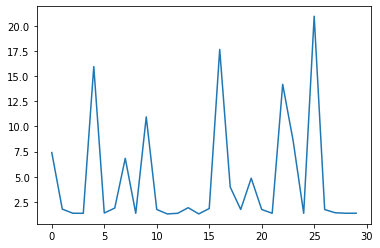

In [11]:
house['inverse distance to the nearest MRT station (km-1)'].plot()

<AxesSubplot:>

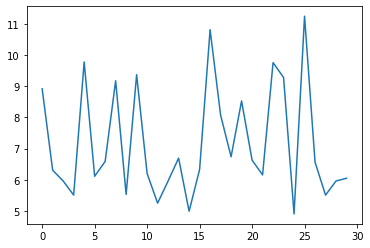

In [12]:
house['price per square metre ($ in thousands)'].plot()

In [13]:
data = house[['inverse distance to the nearest MRT station (km-1)', 'price per square metre ($ in thousands)']]
data.columns =['x','y']
data

,x,y
0,7.404,8.913
1,1.789,6.308
2,1.379,5.963
3,1.373,5.511
4,15.948,9.774
5,1.397,6.114
6,1.894,6.588
7,6.836,9.171
8,1.373,5.533
9,10.948,9.365


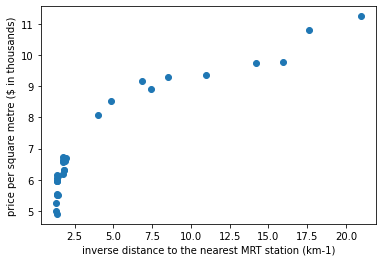

In [14]:
plt.scatter(house['inverse distance to the nearest MRT station (km-1)'],house['price per square metre ($ in thousands)'])
plt.xlabel('inverse distance to the nearest MRT station (km-1)')
plt.ylabel('price per square metre ($ in thousands)')

plt.show()

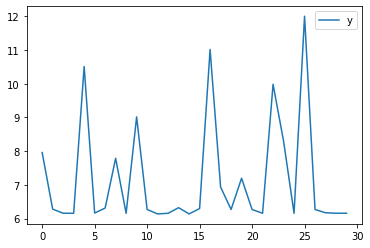

In [15]:
LR = LinearRegression()
LR.fit(data[['x']],data[['y']])
pred=LR.predict(data[['x']])
pred = pd.DataFrame(pred,columns=['y'])
pred.plot()
plt.show()

In [16]:
import statsmodels.api as sm
ols = sm.OLS(data.x,data.y)
result=ols.fit().params
# print(result.summary())

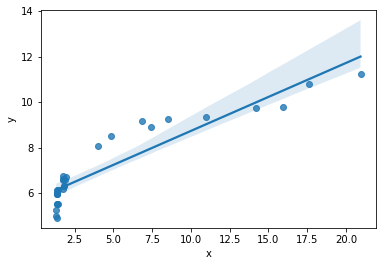

In [17]:
sns.regplot(x='x',y='y',data=data)
plt.show()

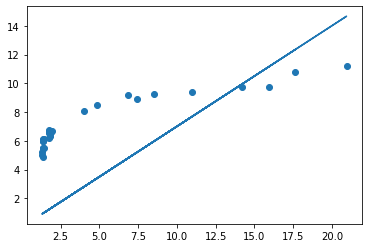

In [18]:
## attempt to code out a best fit line which passes through the origin
# y = mx + b where b = 0 
# let m = 0.7
# y = 3x + 0
# y = 3x
y = 0.7*data.x
plt.scatter(data.x,data.y)
plt.plot(data.x,y)
plt.show()



### We will then try to figure out the best gradient aka m 
*To determine best, we need to find error term* 


In [19]:
# # errorterm=pd.DataFrame(columns=['error'])
# errorterm=np.array([])
# def error(x,y):
#     for x in np.linspace(0.1,1,1000000):
#         y = x*data.x
#         e = (data.y - y)**2/len(data.y)
#         error=np.append(errorterm,e)
#     error=pd.DataFrame(error,columns=['errors'])
#     return error.index[error.errors==error.errors.min()][0]

# print(error(data.x,data.y))

In [20]:
# x=np.linspace(0.1,1,1000000)
# x[17]

In [21]:
# type(errorterm)

In [22]:
n = len(data)
b = sp.symbols('b')
se =[]
for i in data.x:
  yhat = b*data.x
  error = data.y - yhat
  se.append(error**2)

se =np.mean(se) 
sp.simplify(se)

52.9560529666666*b**2 - 86.1205782*b + 54.4808258

In [23]:
sp.diff(se)

105.912105933333*b - 86.1205782

# Gradient Descent for 1 variable

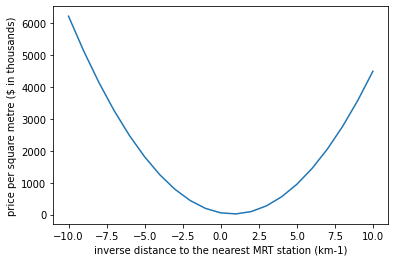

In [24]:
x = np.arange(-10,11,1)
y=52.9560529666666*x**2-86.1205782*x+54.4808258
plt.plot(x,y)
plt.xlabel('inverse distance to the nearest MRT station (km-1)')
plt.ylabel('price per square metre ($ in thousands)')

plt.show()

In [25]:
b = sp.symbols('b')
rate = 0.01 #Set Learning Rate
epsilon = 0.0001 #Stop algorithm when absolute difference between 2 consecutive x-values is less than equation 
max_iter = 1000 # maximum number of iterations
f = lambda b: 52.9560529666666*b**2-86.1205782*b+54.4808258
deriv = lambda b: 105.912105933333*b -86.1205782# derivative of f

x_new_list =[]

def gradient_desc(x):
    diff=1 # differenece between 2 consecutive iterates 
    iter = 1 #iteration counter
    #Now Gradient descent 
    while diff > epsilon and iter < max_iter:
        x_new = x - rate*deriv(x)
        print("Iteration ",iter,": x = ",x_new,", f(x) = ",f(x_new))
        diff = abs(x_new - x)
        f_value = f(x_new)
        iter += 1
        x = x_new
    print("The local minimum occurs at x = ",x_new)
    print("The minimum occurs at f(x) = ",f_value)
    x_new_list.append([round(i, 1),iter,x_new,round(f_value, 4)])
gradient_desc(0)
    





Iteration  1 : x =  0.861205782 , f(x) =  19.589487615858886
Iteration  2 : x =  0.8102903838641712 , f(x) =  19.46753193348222
Iteration  3 : x =  0.8133005561383395 , f(x) =  19.467105661827475
Iteration  4 : x =  0.813122591564715 , f(x) =  19.4671041718803
Iteration  5 : x =  0.8131331130188315 , f(x) =  19.46710416667249
The local minimum occurs at x =  0.8131331130188315
The minimum occurs at f(x) =  19.46710416667249


In [26]:
for i in np.arange(-2.5,2.5,0.1):
    gradient_desc(i)

Iteration  1 : x =  1.0090084303333247 , f(x) =  21.49888864536551
Iteration  2 : x =  0.8015521347224334 , f(x) =  19.474205862245142
Iteration  3 : x =  0.8138171706843177 , f(x) =  19.467128989208383
Iteration  4 : x =  0.8130920487654898 , f(x) =  19.467104253416494
Iteration  5 : x =  0.8131349187414766 , f(x) =  19.467104166957498
The local minimum occurs at x =  0.8131349187414766
The minimum occurs at f(x) =  19.467104166957498
Iteration  1 : x =  1.003096324399992 , f(x) =  21.378089258484216
Iteration  2 : x =  0.8019016646881028 , f(x) =  19.47378363218965
Iteration  3 : x =  0.8137965061024787 , f(x) =  19.467127513387823
Iteration  4 : x =  0.8130932704774587 , f(x) =  19.467104248258067
Iteration  5 : x =  0.8131348465125708 , f(x) =  19.467104166939457
The local minimum occurs at x =  0.8131348465125708
The minimum occurs at f(x) =  19.467104166939457
Iteration  1 : x =  0.9971842184666588 , f(x) =  21.260991817077993
Iteration  2 : x =  0.8022511946537724 , f(x) =  19.4

In [27]:
x_new_list= pd.DataFrame(x_new_list,columns=['x','iter','x_new','f_value'])
# x_new_list.iloc[[x_new_list.f_value.min()]]
#x_new_list sort by f_value and iters

x_new_list.sort_values(by= ['f_value', 'iter'],ascending=True)

,x,iter,x_new,f_value
34,0.8,4,0.813135,19.4671
30,0.4,5,0.813127,19.4671
31,0.5,5,0.813129,19.4671
32,0.6,5,0.813130,19.4671
33,0.7,5,0.813131,19.4671
35,0.9,5,0.813134,19.4671
36,1.0,5,0.813135,19.4671
37,1.1,5,0.813136,19.4671
38,1.2,5,0.813137,19.4671
0,1.4,6,0.813133,19.4671


In [28]:
# testing for best alpha
import numpy as np

alpha = np.arange(0.001,0.25,0.001)

epsilon = 0.0001 # stopping criterion
max_iters = 1000 # maximum number of iterations
iters = []

# partial derivatives and function
f = lambda b: 52.9560529666666*b**2-86.1205782*b+54.4808258
deriv = lambda b: 105.912105933333*b -86.1205782# derivative of f


for a in alpha:
  iter = 1
  diff = 1
  x = 0.8 # initial x value

  while diff > epsilon and iter < max_iter:
    
    x_new = x - a*deriv(x)
    # print("Iteration ",iter,": x = ",x_new,", f(x) = ",f(x_new))
    diff = abs(x_new - x)
    iter += 1
    x = x_new
    if (x_new>10**15):
      print (f'when alpha = {a}, it diverges')
      break
  print("The local minimum occurs at x = ",x_new)

  iters.append([a, iter, round(x_new, 4)])
  if (iter < max_iters):
    print (f'when alpha = {a}, number of iterations = {iter}')
  else: print (f'when alpha = {a}, it diverges')
# print (f'best alpha: {alpha[iters.index(min(iters))]:.3f} with {min(iters)} iterations')

The local minimum occurs at x =  0.8123329609804182
when alpha = 0.001, number of iterations = 26
The local minimum occurs at x =  0.8127629574933752
when alpha = 0.002, number of iterations = 16
The local minimum occurs at x =  0.8129367210294579
when alpha = 0.003, number of iterations = 12
The local minimum occurs at x =  0.8130403671534502
when alpha = 0.004, number of iterations = 10
The local minimum occurs at x =  0.8130655565923471
when alpha = 0.005, number of iterations = 8
The local minimum occurs at x =  0.8131017130505429
when alpha = 0.006, number of iterations = 7
The local minimum occurs at x =  0.8131173335610447
when alpha = 0.007, number of iterations = 6
The local minimum occurs at x =  0.8131253850105855
when alpha = 0.008, number of iterations = 5
The local minimum occurs at x =  0.813131180348219
when alpha = 0.009000000000000001, number of iterations = 4
The local minimum occurs at x =  0.8131352394836266
when alpha = 0.010000000000000002, number of iterations =

In [29]:
iters_df = pd.DataFrame(iters, columns=['a','iterations', 'x_new'])
iters_df = iters_df[iters_df['x_new'] == 0.8131]
#highlight iter_df iterations minimum
iters_df.style.highlight_min(subset=['iterations'],color='blue')

,a,iterations,x_new
4,0.005000,8,0.813100
5,0.006000,7,0.813100
6,0.007000,6,0.813100
7,0.008000,5,0.813100
8,0.009000,4,0.813100
9,0.010000,4,0.813100
10,0.011000,5,0.813100
12,0.013000,8,0.813100
14,0.015000,13,0.813100
15,0.016000,17,0.813100


# Model 1

In [30]:
b = sp.symbols('b')
rate = 0.01 #Set Learning Rate
epsilon = 0.0001 #Stop algorithm when absolute difference between 2 consecutive x-values is less than equation 
max_iter = 1000 # maximum number of iterations
f = lambda b: 52.9560529666666*b**2-86.1205782*b+54.4808258
deriv = lambda b: 105.912105933333*b -86.1205782# derivative of f


def gradient_desc(x):
    diff=1 # differenece between 2 consecutive iterates 
    iter = 1 #iteration counter
    #Now Gradient descent 
    while diff > epsilon and iter < max_iter:
        x_new = x - rate*deriv(x)
        diff = abs(x_new - x)
        f_value = f(x_new)
        iter += 1
        x = x_new
    print("The local minimum occurs at x = ",round(x_new, 4),"\nNumber of iterations: ",iter,"\nf(x) = ",round(f_value, 4))
gradient_desc(0.8)


The local minimum occurs at x =  0.8131 
Number of iterations:  4 
f(x) =  19.4671


# Model 2

## Sympy to show equation of E(a,b)

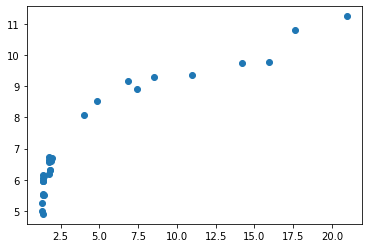

In [31]:
plt.scatter(data.x,data.y)
plt.show()

In [32]:
n = len(data)
a = sp.symbols('a')
b = sp.symbols('b')
se =[]
for i in data.x:
  yhat = a + b*data.x
  error = data.y - yhat
  se.append(error**2)

se =np.mean(se) 
print("E(a,b):",sp.simplify(se),"\nE'(a):",sp.diff(sp.simplify(se),a),"\nE'(b):",sp.diff(sp.simplify(se),b))

E(a,b): 1.0*a**2 + 9.48166666666667*a*b - 14.3246666666667*a + 52.9560529666666*b**2 - 86.1205782*b + 54.4808258 
E'(a): 2.0*a + 9.48166666666667*b - 14.3246666666667 
E'(b): 9.48166666666667*a + 105.912105933333*b - 86.1205782


In [33]:
a = sp.symbols('a')
b = sp.symbols('b')

partialf_a = lambda a,b: 2.0*a + 9.48166666666667*b - 14.3246666666667# partial derivative of f with respect to a
partialf_b = lambda a,b: 9.48166666666667*a + 105.912105933333*b - 86.1205782# partial derivative of f with respect to b
func = lambda a,b: 1.0*a**2 + 9.48166666666667*a*b - 14.3246666666667*a + 52.9560529666666*b**2 - 86.1205782*b + 54.4808258 

 


## Will be using intercept a = 5 and b = 0.3 for a start

In [34]:
# testing for best alpha
import numpy as np

alpha = 0.001 # learning rate
epsilon = 0.0001 # stopping criterion
max_iters = 10000 # maximum number of iterations

# partial derivatives and function
next_a = sp.symbols('a')
next_b = sp.symbols('b')
next_a = 5 # initial a value
next_b = 0.3 # initial b value

func = lambda a,b: 1.0*a**2 + 9.48166666666667*a*b - 14.3246666666667*a + 52.9560529666666*b**2 - 86.1205782*b + 54.4808258 
partialf_a = lambda a,b: 2.0*a + 9.48166666666667*b - 14.3246666666667# partial derivative of f with respect to a
partialf_b = lambda a,b: 9.48166666666667*a + 105.912105933333*b - 86.1205782# partial derivative of f with respect to b


diff = 1
iter =1
next_func = func(next_a, next_b) # initial value of function

while diff > epsilon and iter<max_iters:
    current_a = next_a
    current_b = next_b
    current_func = next_func
    next_a = current_a - alpha*partialf_a(current_a, current_b) # update of a
    next_b = current_b - alpha*partialf_b(current_a, current_b) # update of b
    next_func = func(next_a, next_b)
    diff = abs(next_func - current_func) # stopping criterion values of function converges
    iter += 1
print("The local minimum occurs at a = ",round(next_a, 4),"b =",round(next_b,4),"\nf(x) = ",round(next_func, 4))



The local minimum occurs at a =  5.4707 b = 0.3236 
f(x) =  0.5058


In [58]:
from itertools import product
a = np.arange(-10,11,0.1)
b = np.arange(-10,11,0.1)
df = pd.DataFrame(list(product(a,b)),columns=['a_intercept','b_gradient'])
y= 1.0*df.a_intercept**2 + 9.48166666666667*df.a_intercept*df.b_gradient - 14.3246666666667*df.a_intercept + 52.9560529666666*df.b_gradient**2 - 86.1205782*df.b_gradient + 54.4808258
df['error_function'] = y
df


,a_intercept,b_gradient,error_function
0,-10.0,-10.0,7402.705238
1,-10.0,-9.9,7279.228968
2,-10.0,-9.8,7156.811819
3,-10.0,-9.7,7035.453791
4,-10.0,-9.6,6915.154885
...,...,...,...
44095,10.9,10.5,6036.467478
44096,10.9,10.6,6149.927708
44097,10.9,10.7,6264.447060
44098,10.9,10.8,6380.025533


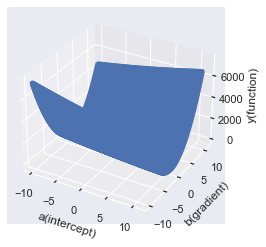

In [36]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

sns.set(style = "darkgrid")

fig = plt.figure()
ax = fig.add_subplot(111, projection = '3d')




ax.set_xlabel("a(intercept)")
ax.set_ylabel("b(gradient)")
ax.set_zlabel("y(function)")

ax.scatter(df.a_intercept,df.b_gradient,df.error_function)

plt.show()

In [59]:
import plotly.express as px


fig = px.scatter_3d(df, x='a_intercept', y='b_gradient', z='error_function', color='error_function')
fig.show()



In [38]:
# df.iloc[[df.error_function.idxmin()]]
# sort error_function 
sorted_df=df.sort_values(by='error_function')
sorted_df

,a_intercept,b_gradient,error_function
33073,5.7,0.3,0.463747
33283,5.8,0.3,0.465730
32863,5.6,0.3,0.481764
33493,5.9,0.3,0.487714
32653,5.5,0.3,0.519780
...,...,...,...
840,-9.6,-10.0,7351.208704
630,-9.7,-10.0,7364.052838
420,-9.8,-10.0,7376.916971
210,-9.9,-10.0,7389.801104


## Code for univariate gradient descent 2 variables

In [39]:
# testing for best alpha
import numpy as np

alpha = 0.001 # learning rate
epsilon = 0.0001 # stopping criterion
max_iters = 10000 # maximum number of iterations

# partial derivatives and function
next_a = sp.symbols('a')
next_b = sp.symbols('b')
next_a = 5.7 # initial a value
next_b = 0.3 # initial b value

func = lambda a,b: 1.0*a**2 + 9.48166666666667*a*b - 14.3246666666667*a + 52.9560529666666*b**2 - 86.1205782*b + 54.4808258 
partialf_a = lambda a,b: 2.0*a + 9.48166666666667*b - 14.3246666666667# partial derivative of f with respect to a
partialf_b = lambda a,b: 9.48166666666667*a + 105.912105933333*b - 86.1205782# partial derivative of f with respect to b


diff = 1
iter =1
next_func = func(next_a, next_b) # initial value of function

while diff > epsilon and iter<max_iters:
    current_a = next_a
    current_b = next_b
    current_func = next_func
    next_a = current_a - alpha*partialf_a(current_a, current_b) # update of a
    next_b = current_b - alpha*partialf_b(current_a, current_b) # update of b
    next_func = func(next_a, next_b)
    diff = abs(next_func - current_func) # stopping criterion values of function converges
    iter += 1
print("The local minimum occurs at a = ",round(next_a, 4),"b =",round(next_b,4),"\nf(x) = ",round(next_func, 4))



The local minimum occurs at a =  5.7001 b = 0.3003 
f(x) =  0.4637


## Based on minimum error from previous gradient descent, we will tune the a(intercept) and b(gradient) with the criteria being <= 14.7943
### I will then run a function which only accepts <14.7493 error by appending the results to a dataframe which will then be sorted and shown.
 

In [45]:
# testing for best alpha
import numpy as np


alpha = [0.02,0.01,0.001]
epsilon = 0.0001 # stopping criterion
max_iters = 10000 # maximum number of iterations
diff = 1
iters_df = []

# partial derivatives and function
func = lambda a,b: 1.0*a**2 + 9.48166666666667*a*b - 14.3246666666667*a + 52.9560529666666*b**2 - 86.1205782*b + 54.4808258 
partialf_a = lambda a,b: 2.0*a + 9.48166666666667*b - 14.3246666666667# partial derivative of f with respect to a
partialf_b = lambda a,b: 9.48166666666667*a + 105.912105933333*b - 86.1205782# partial derivative of f with respect to b
next_as = np.arange(0,10,0.01) # initial x value
next_bs = np.linspace(0,3,30) # initial y value
for a in alpha:

  # for next_a in next_as:
  # for next_b in next_bs:
  for next_a,next_b in product(next_as,next_bs):
      iter = 1
      diff = 1
      initial_a = next_a
      initial_b = next_b
      while diff > epsilon and iter<max_iters:
        current_a = initial_a
        current_b = initial_b
        current_func = next_func
        next_a = current_a - a*partialf_a(current_a, current_b) # update of a
        next_b = current_b - a*partialf_b(current_a, current_b) # update of b
        next_func = func(next_a, next_b)
        diff = abs(next_func - current_func) # stopping criterion values of function converges
        iter += 1
      iters_df.append([a,initial_a,initial_b,next_a,next_b, iter, next_func])
      if (iter < max_iters):
        print (f'when alpha = {a}, number of iterations = {iter},error = {next_func}')
      else: print (f'when alpha = {a}, it diverges')
# get minimum of an array
iters_df = pd.DataFrame(iters_df, columns=['alpha','initial_a','initial_b','next_a','next_b','iterations','next_func'])


iters_df_sorted=iters_df.sort_values(by=['next_func'],ascending=True)

when alpha = 0.02, number of iterations = 3,error = 63.90752761333241
when alpha = 0.02, number of iterations = 3,error = 53.132811128380276
when alpha = 0.02, number of iterations = 3,error = 43.81920491462373
when alpha = 0.02, number of iterations = 3,error = 35.96670897206281
when alpha = 0.02, number of iterations = 3,error = 29.575323300697484
when alpha = 0.02, number of iterations = 3,error = 24.645047900527736
when alpha = 0.02, number of iterations = 3,error = 21.175882771553596
when alpha = 0.02, number of iterations = 3,error = 19.167827913775028
when alpha = 0.02, number of iterations = 3,error = 18.620883327192082
when alpha = 0.02, number of iterations = 3,error = 19.53504901180471
when alpha = 0.02, number of iterations = 3,error = 21.910324967612958
when alpha = 0.02, number of iterations = 3,error = 25.74671119461678
when alpha = 0.02, number of iterations = 3,error = 31.044207692816194
when alpha = 0.02, number of iterations = 3,error = 37.80281446221122
when alpha =

In [46]:
iters_df_sorted.head(1)

,alpha,initial_a,initial_b,next_a,next_b,iterations,next_func
47253,0.01,5.75,0.310345,5.748821,0.297662,3,0.462129


# Final model 2

In [49]:
# testing for best alpha
import numpy as np

alpha = 0.01 # learning rate
epsilon = 0.0001 # stopping criterion
max_iters = 1000 # maximum number of iterations

# partial derivatives and function
next_a = sp.symbols('a')
next_b = sp.symbols('b')
next_a = 5.75 # initial a value
next_b = 0.31 # initial b value

func = lambda a,b: 1.0*a**2 + 9.48166666666667*a*b - 14.3246666666667*a + 52.9560529666666*b**2 - 86.1205782*b + 54.4808258 
partialf_a = lambda a,b: 2.0*a + 9.48166666666667*b - 14.3246666666667# partial derivative of f with respect to a
partialf_b = lambda a,b: 9.48166666666667*a + 105.912105933333*b - 86.1205782# partial derivative of f with respect to b


diff = 1
iter =1
next_func = func(next_a, next_b) # initial value of function

while diff > epsilon and iter<max_iters:
    current_a = next_a
    current_b = next_b
    current_func = next_func
    next_a = current_a - alpha*partialf_a(current_a, current_b) # update of a
    next_b = current_b - alpha*partialf_b(current_a, current_b) # update of b
    next_func = func(next_a, next_b)
    diff = abs(next_func - current_func) # stopping criterion values of function converges
    iter += 1
print("The local minimum occurs at a = ",round(next_a, 4),"b =",round(next_b,4),"\nf(x) = ",round(next_func, 4),"\nIter = ",iter)



The local minimum occurs at a =  5.7489 b = 0.2985 
f(x) =  0.4621 
Iter =  3


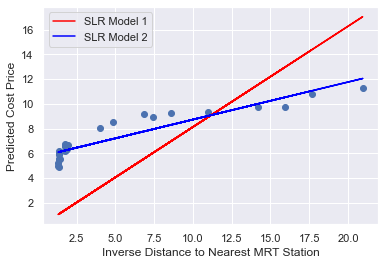

In [43]:
# x is inverse distance to nearest MRT station
# y is predicted cost price 

SLR_Model_1 = 0.8131*data.x
SLR_Model_2 = 5.7013 + 0.3028*data.x
plt.scatter(data.x,data.y)


# line plot of the two models
plt.plot(data.x,SLR_Model_1,color='red',label='SLR Model 1')
plt.plot(data.x,SLR_Model_2,color='blue',label='SLR Model 2')
plt.xlabel('Inverse Distance to Nearest MRT Station')
plt.ylabel('Predicted Cost Price')
# legend of line plot
plt.legend()


plt.show()

# Model 3

In [93]:
data['w']=house['inverse age of flat (year-1)']


In [94]:
n = len(data)
a = sp.symbols('a')
b = sp.symbols('b')
c = sp.symbols('c')
se =[]
for i in data.x:
  yhat = a + b*data.x + c*data.w
  error = data.y - yhat
  se.append(error**2)

se =np.mean(se) 
print("E(a,b,c):",sp.simplify(se),"\nE'(a):",sp.diff(sp.simplify(se),a),"\nE'(b):",sp.diff(sp.simplify(se),b),"\nE'(c):",sp.diff(sp.simplify(se),c))

E(a,b,c): 1.0*a**2 + 9.48166666666667*a*b + 0.226733333333333*a*c - 14.3246666666667*a + 52.9560529666667*b**2 + 1.5078038*b*c - 86.1205782*b + 0.0154496333333333*c**2 - 1.78927586666667*c + 54.4808258 
E'(a): 2.0*a + 9.48166666666667*b + 0.226733333333333*c - 14.3246666666667 
E'(b): 9.48166666666667*a + 105.912105933333*b + 1.5078038*c - 86.1205782 
E'(c): 0.226733333333333*a + 1.5078038*b + 0.0308992666666667*c - 1.78927586666667


In [95]:
yhat1 = a + b*data.x + c*data.w
error1 = data.y - yhat1
se1 = error1**2
def f(a,b,c):
  return np.sum(se1)/(len(data))
f(a, b, c).simplify()
ea = sp.diff(f(a, b, c), a)
print (ea)

2.0*a + 9.48166666666667*b + 0.226733333333333*c - 14.3246666666667


In [161]:
A = [[2, 9.481, 0.2267], [9.481, 105.912, 1.5078], [0.2267, 1.5078, 0.0308]]
Y = [14.324, 86.12, 1.789]
print(np.linalg.inv(A).dot(Y))

[ 4.33193343  0.17275147 17.74272802]


In [245]:
# testing for best alpha
import numpy as np

alpha = 0.01 # learning rate
epsilon = 0.0001 # stopping criterion
max_iters = 10000 # maximum number of iterations

# partial derivatives and function
next_a = sp.symbols('a')
next_b = sp.symbols('b')
next_a = 1 # initial a value
next_b = 1 # initial b value
next_c = 1 # initial c value

func = lambda a,b,c: 1.0*a**2 + 9.48166666666667*a*b + 0.226733333333333*a*c - 14.3246666666667*a + 52.9560529666667*b**2 + 1.5078038*b*c - 86.1205782*b + 0.0154496333333333*c**2 - 1.78927586666667*c + 54.4808258 
partialf_a = lambda a,b,c: 2.0*a + 9.48166666666667*b + 0.226733333333333*c - 14.3246666666667  # partial derivative of f with respect to a
partialf_b = lambda a,b,c: 9.48166666666667*a + 105.912105933333*b + 1.5078038*c - 86.1205782 # partial derivative of f with respect to b
partialf_c = lambda a,b,c: 0.226733333333333*a + 1.5078038*b + 0.0308992666666667*c - 1.78927586666667# partial derivative of f with respect to c

diff = 1
iter =1
next_func = func(next_a,next_b,next_c) # initial value of function

while diff > epsilon and iter<max_iters:
    current_a = next_a
    current_b = next_b
    current_c = next_c
    current_func = next_func
    next_a = current_a - alpha*partialf_a(current_a, current_b,current_c) # update of a
    next_b = current_b - alpha*partialf_b(current_a, current_b,current_c) # update of b
    next_c = current_c - alpha*partialf_c(current_a, current_b,current_c) # update of c
    next_func = func(next_a, next_b,next_c)
    diff = abs(next_func - current_func) # stopping criterion values of function converges
    iter += 1
print("The local minimum occurs at a = ",round(next_a, 4),"b =",round(next_b,4),"c =",round(next_c,4),"\nf(x) = ",round(next_func, 4),"\nIter = ",iter)



The local minimum occurs at a =  5.5497 b = 0.2954 c = 1.4741 
f(x) =  0.4149 
Iter =  352


In [252]:
func(4.3319,0.17275,17.7427)

0.15678642106420426

In [122]:
print (type((se)))

<class 'sympy.core.add.Add'>


In [129]:
a_value = 1
b_value = 1
c_value = 1
print (se.subs({a:a_value,b:b_value,c:c_value}))

17.4340114666667


In [253]:
from itertools import product
a = sp.symbols('a')
b = sp.symbols('b')
c = sp.symbols('c')
a = np.arange(0,10,0.1)
b = np.arange(0,3,0.1)
c = np.arange(0,51,0.11)
df_model3 = pd.DataFrame(list(product(a,b,c)),columns=['a','b','c'])
error =  1.0*df_model3.a**2 + 9.48166666666667*df_model3.a*df_model3.b + 0.226733333333333*df_model3.a*df_model3.c - 14.3246666666667*df_model3.a + 52.9560529666667*df_model3.b**2 + 1.5078038*df_model3.b*df_model3.c - 86.1205782*df_model3.b + 0.0154496333333333*df_model3.c**2 - 1.78927586666667*df_model3.c + 54.4808258  # function
df_model3['error_function'] = error
df_model3


,a,b,c,error_function
0,0.0,0.0,0.00,54.480826
1,0.0,0.0,0.11,54.284192
2,0.0,0.0,0.22,54.087933
3,0.0,0.0,0.33,53.892047
4,0.0,0.0,0.44,53.696535
...,...,...,...,...
1391995,9.9,2.9,50.49,761.657314
1391996,9.9,2.9,50.60,762.360194
1391997,9.9,2.9,50.71,763.063448
1391998,9.9,2.9,50.82,763.767076


In [255]:
df_model3[df_model3['error_function']==df_model3['error_function'].min()]

,a,b,c,error_function
627466,4.5,0.2,15.18,0.162187


In [254]:
df_model3 = df_model3[(df_model3.error_function > 0) & (df_model3.error_function < 1)]
df_model3 = df_model3.sort_values(by='error_function',ascending=True)
print (df_model3.c.min(), df_model3.c.max())

0.0 44.88


In [54]:
from itertools import product
a = sp.symbols('a')
b = sp.symbols('b')
c = sp.symbols('c')
a = np.arange(3, 5, 0.1)
b = np.arange(0,1, 0.1)
c = np.arange(15, 20, 0.1)
df_model3 = pd.DataFrame(list(product(a,b,c)),columns=['a','b','c'])
error =  1.0*df_model3.a**2 + 9.48166666666667*df_model3.a*df_model3.b + 0.226733333333333*df_model3.a*df_model3.c - 14.3246666666667*df_model3.a + 52.9560529666667*df_model3.b**2 + 1.5078038*df_model3.b*df_model3.c - 86.1205782*df_model3.b + 0.0154496333333333*df_model3.c**2 - 1.78927586666667*df_model3.c + 54.4808258  # function
df_model3['error_function'] = error
df_model3


,a,b,c,error_function
0,3.0,0.0,15.0,7.346855
1,3.0,0.0,15.1,7.282451
2,3.0,0.0,15.2,7.218356
3,3.0,0.0,15.3,7.154570
4,3.0,0.0,15.4,7.091092
...,...,...,...,...
9995,4.9,0.9,19.5,34.610162
9996,4.9,0.9,19.6,34.738444
9997,4.9,0.9,19.7,34.867035
9998,4.9,0.9,19.8,34.995935


In [55]:
# df_model3 = df_model3[(df_model3.error_function > 0) & (df_model3.error_function < 1)]
df_model3 = df_model3.sort_values(by='error_function',ascending=True)
df_model3.head(10)

,a,b,c,error_function
7601,4.5,0.2,15.1,0.162155
7602,4.5,0.2,15.2,0.162226
7600,4.5,0.2,15.0,0.162393
7603,4.5,0.2,15.3,0.162606
7604,4.5,0.2,15.4,0.163295
7109,4.4,0.2,15.9,0.163701
7108,4.4,0.2,15.8,0.163735
7110,4.4,0.2,16.0,0.163977
7107,4.4,0.2,15.7,0.164077
7605,4.5,0.2,15.5,0.164293


In [256]:
# testing for best alpha
   

import numpy as np

alpha = 0.01 # learning rate
epsilon = 0.0001 # stopping criterion
max_iters = 1000000 # maximum number of iterations

# partial derivatives and function
next_a = sp.symbols('a')
next_b = sp.symbols('b')
next_c = sp.symbols('c')
next_a =4.5  # initial a value
next_b = 0.2 # initial b value
next_c = 15.18 # initial c value

func = lambda a,b,c: 1.0*a**2 + 9.48166666666667*a*b + 0.226733333333333*a*c - 14.3246666666667*a + 52.9560529666667*b**2 + 1.5078038*b*c - 86.1205782*b + 0.0154496333333333*c**2 - 1.78927586666667*c + 54.4808258 
partialf_a = lambda a,b,c: 2.0*a + 9.48166666666667*b + 0.226733333333333*c - 14.3246666666667  # partial derivative of f with respect to a
partialf_b = lambda a,b,c: 9.48166666666667*a + 105.912105933333*b + 1.5078038*c - 86.1205782 # partial derivative of f with respect to b
partialf_c = lambda a,b,c: 0.226733333333333*a + 1.5078038*b + 0.0308992666666667*c - 1.78927586666667# partial derivative of f with respect to c

diff = 1
iter =1
next_func = func(next_a,next_b,next_c) # initial value of function

while diff > epsilon and iter<max_iters:
    current_a = next_a
    current_b = next_b
    current_c = next_c
    current_func = next_func
    next_a = current_a - alpha*partialf_a(current_a, current_b,current_c) # update of a
    next_b = current_b - alpha*partialf_b(current_a, current_b,current_c) # update of b
    next_c = current_c - alpha*partialf_c(current_a, current_b,current_c) # update of c
    next_func = func(next_a, next_b,next_c)
    diff = abs(next_func - current_func) # stopping criterion values of function converges
    iter += 1
print("The local minimum occurs at a = ",round(next_a, 4),"b =",round(next_b,4),"c =",round(next_c,4),"\nf(x) = ",round(next_func, 4),"\nIter = ",iter)



The local minimum occurs at a =  4.5003 b = 0.1942 c = 15.1801 
f(x) =  0.1604 
Iter =  3


In [15]:
import numpy as np

alphas = [0.02,0.01,0.005,0.001] # learning rate
epsilon = 0.0001 # stopping criterion
max_iters = 1000 # maximum number of iterations

# partial derivatives and function
next_a = sp.symbols('a')
next_b = sp.symbols('b')
next_c = sp.symbols('c')
# next_a = 5.7 # initial a value
# next_b = 0.3 # initial b value

func = lambda a,b,c: 1.0*a**2 + 9.48166666666667*a*b + 0.226733333333333*a*c - 14.3246666666667*a + 52.9560529666667*b**2 + 1.5078038*b*c - 86.1205782*b + 0.0154496333333333*c**2 - 1.78927586666667*c + 54.4808258 
partialf_a = lambda a,b,c: 2.0*a + 9.48166666666667*b + 0.226733333333333*c - 14.3246666666667  # partial derivative of f with respect to a
partialf_b = lambda a,b,c: 9.48166666666667*a + 105.912105933333*b + 1.5078038*c - 86.1205782 # partial derivative of f with respect to b
partialf_c = lambda a,b,c: 0.226733333333333*a + 1.5078038*b + 0.0308992666666667*c - 1.78927586666667# partial derivative of f with respect to c

# a = np.arange(3, 5, 0.1)
# b = np.arange(0,1, 0.1)
# c = np.arange(15, 20, 0.1)
error_list = []
for alpha in alphas:
    for a_val in np.arange(3, 6, 0.1):
        for b_val in np.arange(0,1, 0.1):
            for c_val in np.arange(0, 50, 1):
                diff = 1
                iter =1
                next_a = a_val
                next_b = b_val
                next_c = c_val
                next_func = func(next_a,next_b,next_c) # initial value of function
    
                while diff > epsilon and iter<max_iters:
                    current_a = next_a
                    current_b = next_b
                    current_c = next_c
                    current_func = next_func
                    next_a = current_a - alpha*partialf_a(current_a, current_b, current_c) # update of a
                    next_b = current_b - alpha*partialf_b(current_a, current_b, current_c) # update of b
                    next_c = current_c - alpha*partialf_c(current_a, current_b, current_c) # update of c
                    next_func = func(next_a, next_b, next_c)
                    diff = abs(next_func - current_func) # stopping criterion values of function converges
                    iter += 1
                error_list.append([alpha,a_val, b_val, c_val, next_a, next_b, next_c, next_func, iter])
# print("The local minimum occurs at a = ",round(next_a, 4),"b =",round(next_b,4),"c =",round(next_c, 4), "\nf(x) = ",round(next_func, 4),"\nIter = ",iter)

error_df = pd.DataFrame(error_list, columns=['alpha','a_val', 'b_val', 'c_val', 'next_a', 'next_b', 'next_c', 'next_func', 'iter'])
error_df = error_df.sort_values(by=['next_func'])
error_df.head()

,alpha,a_val,b_val,c_val,next_a,next_b,next_c,next_func,iter
22167,0.010,4.4,0.3,17,4.389057,0.178177,16.998262,0.156179,4
37167,0.005,4.4,0.3,17,4.389126,0.178796,16.998272,0.156197,8
22117,0.010,4.4,0.2,17,4.397728,0.177404,16.999657,0.156199,4
37117,0.005,4.4,0.2,17,4.397811,0.177905,16.999668,0.156213,6
22217,0.010,4.4,0.4,17,4.380386,0.178951,16.996866,0.156247,4


In [221]:
diff = 1
iter =1
next_a = 4.5
next_b = 1.4
next_c = 17.0
alpha =0.01
next_func = func(next_a,next_b,next_c) # initial value of function
func = lambda a,b,c: 1.0*a**2 + 9.48166666666667*a*b + 0.226733333333333*a*c - 14.3246666666667*a + 52.9560529666667*b**2 + 1.5078038*b*c - 86.1205782*b + 0.0154496333333333*c**2 - 1.78927586666667*c + 54.4808258 
partialf_a = lambda a,b,c: 2.0*a + 9.48166666666667*b + 0.226733333333333*c - 14.3246666666667  # partial derivative of f with respect to a
partialf_b = lambda a,b,c: 9.48166666666667*a + 105.912105933333*b + 1.5078038*c - 86.1205782 # partial derivative of f with respect to b
partialf_c = lambda a,b,c: 0.226733333333333*a + 1.5078038*b + 0.0308992666666667*c - 1.78927586666667# partial derivative of f with respect to c

while diff > epsilon and iter<max_iters:
    current_a = next_a
    current_b = next_b
    current_c = next_c
    current_func = next_func
    next_a = current_a - alpha*partialf_a(current_a, current_b, current_c) # update of a
    next_b = current_b - alpha*partialf_b(current_a, current_b, current_c) # update of b
    next_c = current_c - alpha*partialf_c(current_a, current_b, current_c) # update of c
    next_func = func(next_a, next_b, next_c)
    diff = abs(next_func - current_func) # stopping criterion values of function converges
    iter += 1
print("The local minimum occurs at a = ",round(next_a, 4),"b =",round(next_b,4),"c =",round(next_c, 4), "\nf(x) = ",round(next_func, 4),"\nIter = ",iter)

The local minimum occurs at a =  4.3896 b = 0.1784 c = 16.9825 
f(x) =  0.1562 
Iter =  5


In [240]:
# tuning alpha 
iters_df = []
alphas = [0.0001, 0.001, 0.01,0.025 ]
epsilon = 0.0001 # stopping criterion
max_iters = 10000 # maximum number of iterations

for alpha in alphas:
  iter = 1
  diff = 1
  next_a = 4.4
  next_b = 0.3
  next_c = 17
  func = lambda a,b,c: 1.0*a**2 + 9.48166666666667*a*b + 0.226733333333333*a*c - 14.3246666666667*a + 52.9560529666667*b**2 + 1.5078038*b*c - 86.1205782*b + 0.0154496333333333*c**2 - 1.78927586666667*c + 54.4808258 
  partialf_a = lambda a,b,c: 2.0*a + 9.48166666666667*b + 0.226733333333333*c - 14.3246666666667  # partial derivative of f with respect to a
  partialf_b = lambda a,b,c: 9.48166666666667*a + 105.912105933333*b + 1.5078038*c - 86.1205782 # partial derivative of f with respect to b
  partialf_c = lambda a,b,c: 0.226733333333333*a + 1.5078038*b + 0.0308992666666667*c - 1.78927586666667# partial derivative of f with respect to c
  next_func = func(next_a,next_b,next_c) # initial value of function
  while diff > epsilon and iter<max_iters:
    current_a = next_a
    current_b = next_b
    current_c = next_c
    current_func = next_func
    next_a = current_a - alpha*partialf_a(current_a, current_b, current_c) # update of a
    next_b = current_b - alpha*partialf_b(current_a, current_b, current_c) # update of b
    next_c = current_c - alpha*partialf_c(current_a, current_b, current_c) # update of c
    next_func = func(next_a, next_b, next_c)
    diff = abs(next_func - current_func) # stopping criterion values of function converges
    iter += 1
  if (iter < max_iters):
      print (f'when alpha = {alpha}, number of iterations = {iter},error = {next_func}')
  else: print (f'when alpha = {alpha}, it diverges')
# get minimum of an array

when alpha = 0.0001, number of iterations = 242,error = 0.16069491038521022
when alpha = 0.001, number of iterations = 35,error = 0.15654764717528025
when alpha = 0.01, number of iterations = 4,error = 0.1561787326896109
when alpha = 0.025, number of iterations = 695,error = inf


# tuning alpha gave best of 0.01

In [259]:
diff = 1
iter =1
next_a = 4.5
next_b = 1.4
next_c = 17.0
epsilon = 0.0001 # stopping criterion
max_iters = 10000 # maximum number of iterations
alpha =0.01
next_func = func(next_a,next_b,next_c) # initial value of function
func = lambda a,b,c: 1.0*a**2 + 9.48166666666667*a*b + 0.226733333333333*a*c - 14.3246666666667*a + 52.9560529666667*b**2 + 1.5078038*b*c - 86.1205782*b + 0.0154496333333333*c**2 - 1.78927586666667*c + 54.4808258 
partialf_a = lambda a,b,c: 2.0*a + 9.48166666666667*b + 0.226733333333333*c - 14.3246666666667  # partial derivative of f with respect to a
partialf_b = lambda a,b,c: 9.48166666666667*a + 105.912105933333*b + 1.5078038*c - 86.1205782 # partial derivative of f with respect to b
partialf_c = lambda a,b,c: 0.226733333333333*a + 1.5078038*b + 0.0308992666666667*c - 1.78927586666667# partial derivative of f with respect to c

while diff > epsilon and iter<max_iters:
    current_a = next_a
    current_b = next_b
    current_c = next_c
    current_func = next_func
    next_a = current_a - alpha*partialf_a(current_a, current_b, current_c) # update of a
    next_b = current_b - alpha*partialf_b(current_a, current_b, current_c) # update of b
    next_c = current_c - alpha*partialf_c(current_a, current_b, current_c) # update of c
    next_func = func(next_a, next_b, next_c)
    diff = abs(next_func - current_func) # stopping criterion values of function converges
    iter += 1
print("The local minimum occurs at a = ",round(next_a, 4),"b =",round(next_b,4),"c =",round(next_c, 4), "\nf(x) = ",round(next_func, 4),"\nIter = ",iter)


The local minimum occurs at a =  4.3896 b = 0.1784 c = 16.9825 
f(x) =  0.1562 
Iter =  5


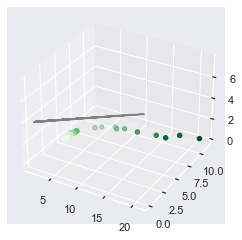

In [184]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
# zline = np.linspace(0, 15, 1000)
# xline = np.sin(zline)
# yline = np.cos(zline)
ax.plot3D(data.x,data.w, SLR_Model_3 , 'gray')
# plt.plot(data.x,SLR_Model_1,color='red',label='SLR Model 1')
# plt.plot(data.x,SLR_Model_2,color='blue',label='SLR Model 2')
# plt.plot(data.x,SLR_Model_3,color='green',label='SLR Model 3')

# Data for three-dimensional scattered points
# zdata = 15 * np.random.random(100)
# xdata = np.sin(zdata) + 0.1 * np.random.randn(100)
# ydata = np.cos(zdata) + 0.1 * np.random.randn(100)
ax.scatter3D(data.x, data.y, data.w, c=data.w, cmap='Greens');

In [185]:
# import plotly.express as px
# fig = px.line_3d(df_model3, x="a", y="b", z="c", color='error_function')
# fig.show()

In [57]:
import plotly.express as px
a = sp.symbols('a')
b = sp.symbols('b')
c=sp.symbols('c')
# a = np.arange(-10,11,0.1)
# b = np.arange(-10,11,0.1)
# a,b = np.meshgrid(a,b)
# y= 1.0*a**2 + 9.48166666666667*a*b - 14.3246666666667*a + 52.9560529666666*b**2 - 86.1205782*b + 54.4808258 
fig = px.scatter_3d(df_model3, x='a', y='b', z='error_function', symbol='c', color='c')
fig.show()



In [266]:
house

,inverse age of flat (year-1),inverse distance to the nearest MRT station (km-1),price per square metre ($ in thousands)
0,0.160,7.404,8.913
1,0.114,1.789,6.308
2,0.049,1.379,5.963
3,0.046,1.373,5.511
4,0.183,15.948,9.774
5,0.115,1.397,6.114
6,0.120,1.894,6.588
7,0.145,6.836,9.171
8,0.076,1.373,5.533
9,0.183,10.948,9.365


In [1]:
# finding if it is actually possible that Model 1 can be the best for 1 of the datapoint.
SLR_Model_1 = 0.8131*data.x
SLR_Model_2 = 5.7013 + 0.3028*data.x
SLR_Model_3=4.3896 +0.1784*data.x+16.9825*data.w
pred = data.y 
david=pd.DataFrame()
david['Model_1_error']=abs(SLR_Model_1-pred)
david['Model_2_error']=abs(SLR_Model_2-pred)
david['Model_3_error']=abs(SLR_Model_3-pred)
david['lowest']= np.min(david[['Model_1_error','Model_2_error','Model_3_error']],axis=1)
# david['lowest_model']=
s=False
for i in range(len(david)):

    if david['Model_1_error'][i]==david['lowest'][i]:
        s = True
        print(david.index[i])
if s == True:
    print('For 1 of the Data points the Model 1 is the best')
else:
    print(' Model 1 is never the best')



NameError: name 'data' is not defined

In [278]:
david

,Model_1_error,Model_2_error,Model_3_error,lowest
0,2.892808,0.969769,0.485326,0.485326
1,4.853364,0.064991,0.336763,0.064991
2,4.841735,0.155861,0.495244,0.155861
3,4.394614,0.606044,0.095262,0.095262
4,3.193319,0.756354,0.568521,0.568521
5,4.978099,0.010312,0.477812,0.010312
6,5.047989,0.313197,0.177390,0.177390
7,3.612648,1.399759,1.099395,1.099395
8,4.416614,0.584044,0.392213,0.392213
9,0.463181,0.348646,0.085521,0.085521


In [13]:
diff = 1
iter =1
next_a = 4.5
next_b = 1.4
next_c = 17.0
epsilon = 0.0001 # stopping criterion
max_iters = 10000 # maximum number of iterations
alpha =0.01
func = lambda a,b,c: 1.0*a**2 + 9.48166666666667*a*b + 0.226733333333333*a*c - 14.3246666666667*a + 52.9560529666667*b**2 + 1.5078038*b*c - 86.1205782*b + 0.0154496333333333*c**2 - 1.78927586666667*c + 54.4808258 
partialf_a = lambda a,b,c: 2.0*a + 9.48166666666667*b + 0.226733333333333*c - 14.3246666666667  # partial derivative of f with respect to a
partialf_b = lambda a,b,c: 9.48166666666667*a + 105.912105933333*b + 1.5078038*c - 86.1205782 # partial derivative of f with respect to b
partialf_c = lambda a,b,c: 0.226733333333333*a + 1.5078038*b + 0.0308992666666667*c - 1.78927586666667# partial derivative of f with respect to c
next_func = func(next_a,next_b,next_c) # initial value of function

while diff > epsilon and iter<max_iters:
    current_a = next_a
    current_b = next_b
    current_c = next_c
    current_func = next_func
    next_a = current_a - alpha*partialf_a(current_a, current_b, current_c) # update of a
    next_b = current_b - alpha*partialf_b(current_a, current_b, current_c) # update of b
    next_c = current_c - alpha*partialf_c(current_a, current_b, current_c) # update of c
    next_func = func(next_a, next_b, next_c)
    diff = abs(next_func - current_func) # stopping criterion values of function converges
    iter += 1
print("The local minimum occurs at a = ",round(next_a, 4),"b =",round(next_b,4),"c =",round(next_c, 4), "\nf(x) = ",round(next_func, 4),"\nIter = ",iter)



The local minimum occurs at a =  4.3896 b = 0.1784 c = 16.9825 
f(x) =  0.1562 
Iter =  5
